# Load Libraries

In [150]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, AdaBoostRegressor
from sklearn.svm import SVR
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor
from catboost import CatBoostRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Data Loading

In [151]:
df = pd.read_csv('retail_store_inventory.csv')
display(df.head())
display(df.tail())

,Date,Store ID,Product ID,Category,Region,Inventory Level,Units Sold,Units Ordered,Demand Forecast,Price,Discount,Weather Condition,Holiday/Promotion,Competitor Pricing,Seasonality
0,2022-01-01,S001,P0005,Toys,East,231,127,55,135.47,33.50,15,Sunny,1,29.69,Spring
1,2022-01-01,S001,P0001,Electronics,South,204,150,66,144.04,63.01,0,Cloudy,0,66.16,Spring
2,2022-01-01,S001,P0003,Electronics,South,102,65,51,74.02,27.99,0,Snowy,0,31.32,Spring
3,2022-01-01,S003,P0002,Electronics,North,469,61,164,62.18,32.72,0,Snowy,0,34.74,Spring
4,2022-01-01,S001,P0002,Electronics,East,166,14,135,9.26,73.64,5,Sunny,0,68.95,Summer


,Date,Store ID,Product ID,Category,Region,Inventory Level,Units Sold,Units Ordered,Demand Forecast,Price,Discount,Weather Condition,Holiday/Promotion,Competitor Pricing,Seasonality
73095,2024-01-01,S004,P0001,Electronics,East,96,8,127,18.46,73.73,0,Sunny,0,72.45,Autumn
73096,2024-01-01,S001,P0001,Electronics,North,313,51,101,48.43,82.57,0,Snowy,0,83.78,Autumn
73097,2024-01-01,S005,P0002,Electronics,East,278,36,151,39.65,11.11,5,Rainy,0,10.91,Spring
73098,2024-01-01,S002,P0001,Furniture,East,374,264,21,270.52,53.14,0,Rainy,0,55.80,Autumn
73099,2024-01-01,S001,P0001,Electronics,South,117,6,165,2.33,78.39,0,Snowy,1,79.52,Spring


# Data Exploration

In [152]:
# Explore Unique Categories
print("Unique Categories:", df['Category'].unique())

Unique Categories: ['Toys' 'Electronics' 'Furniture' 'Groceries' 'Clothing']


In [153]:
print("Dataset Shape:", df.shape)

Dataset Shape: (73100, 15)


In [154]:
print("Missing Values (%):\n", df.isnull().sum() * 100 / df.shape[0])

Missing Values (%):
 Date                  0.0
Store ID              0.0
Product ID            0.0
Category              0.0
Region                0.0
Inventory Level       0.0
Units Sold            0.0
Units Ordered         0.0
Demand Forecast       0.0
Price                 0.0
Discount              0.0
Weather Condition     0.0
Holiday/Promotion     0.0
Competitor Pricing    0.0
Seasonality           0.0
dtype: float64


In [155]:
print("Duplicate Rows:", df.duplicated().sum())

Duplicate Rows: 0


In [156]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 73100 entries, 0 to 73099
Data columns (total 15 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Date                73100 non-null  object 
 1   Store ID            73100 non-null  object 
 2   Product ID          73100 non-null  object 
 3   Category            73100 non-null  object 
 4   Region              73100 non-null  object 
 5   Inventory Level     73100 non-null  int64  
 6   Units Sold          73100 non-null  int64  
 7   Units Ordered       73100 non-null  int64  
 8   Demand Forecast     73100 non-null  float64
 9   Price               73100 non-null  float64
 10  Discount            73100 non-null  int64  
 11  Weather Condition   73100 non-null  object 
 12  Holiday/Promotion   73100 non-null  int64  
 13  Competitor Pricing  73100 non-null  float64
 14  Seasonality         73100 non-null  object 
dtypes: float64(3), int64(5), object(7)
memory usage: 8.4+

In [157]:
display(df.describe())

,Inventory Level,Units Sold,Units Ordered,Demand Forecast,Price,Discount,Holiday/Promotion,Competitor Pricing
count,73100.000000,73100.000000,73100.000000,73100.000000,73100.000000,73100.000000,73100.000000,73100.000000
mean,274.469877,136.464870,110.004473,141.494720,55.135108,4.966553,0.200000,55.146077
std,129.949514,108.919406,52.277448,109.254076,26.021945,6.108381,0.400003,26.191408
min,50.000000,0.000000,20.000000,-9.990000,10.000000,0.000000,0.000000,5.030000
25%,162.000000,49.000000,65.000000,53.670000,32.650000,0.000000,0.000000,32.680000
50%,273.000000,107.000000,110.000000,113.015000,55.050000,0.000000,0.000000,55.010000
75%,387.000000,203.000000,155.000000,208.052500,77.860000,10.000000,0.000000,77.820000
max,500.000000,499.000000,200.000000,518.550000,100.000000,20.000000,1.000000,104.940000


In [158]:
display(df.describe(include='object'))

,Date,Store ID,Product ID,Category,Region,Weather Condition,Seasonality
count,73100,73100,73100,73100,73100,73100,73100
unique,731,5,5,5,4,4,4
top,2022-01-01,S001,P0001,Electronics,East,Sunny,Spring
freq,100,51238,29155,43830,36582,43739,47370


In [159]:
df['Store ID'].unique()

array(['S001', 'S003', 'S005', 'S002', 'S004'], dtype=object)

In [160]:
rename_dict = {
    'S001': 'Store A',
    'S002': 'Store B',
    'S003': 'Store C',
    'S004': 'Store D',
    'S005': 'Store E'
}
df['Store ID'] = df['Store ID'].replace(rename_dict)
print("New Store Names:", df['Store ID'].unique())

New Store Names: ['Store A' 'Store C' 'Store E' 'Store B' 'Store D']


In [161]:
# Get unique Product IDs and their corresponding Category
product_category_group = df.groupby('Product ID')['Category'].unique().reset_index()

# Display the result
product_category_group

,Product ID,Category
0,P0001,"[Electronics, Furniture, Groceries, Clothing, Toys]"
1,P0002,"[Electronics, Toys, Furniture, Groceries, Clothing]"
2,P0003,"[Electronics, Furniture, Groceries, Clothing, Toys]"
3,P0004,"[Electronics, Clothing, Toys, Groceries, Furniture]"
4,P0005,"[Toys, Electronics, Clothing, Furniture, Groceries]"


In [162]:
# Function to rename Product ID based on Category
def rename_product(row):
    # Extract numeric part of Product ID
    product_number = int(row['Product ID'][1:])  # Remove the 'P' and convert to int
    
    # Define a mapping for categories to their respective initials
    category_initials = {
        'Groceries': 'G',
        'Toys': 'T',
        'Electronics': 'E',
        'Clothing': 'C',
        'Furniture': 'F'
    }
    
    # Get the category initial
    category_initial = category_initials.get(row['Category'], '')
    
    # Construct the new Product ID (e.g., P1G, P2T, etc.)
    renamed_id = f"P{product_number}{category_initial.upper()}"
    
    return renamed_id

# Apply the renaming function to the DataFrame
df['Product ID'] = df.apply(rename_product, axis=1)

# Display the DataFrame with renamed Product IDs
df.head()

,Date,Store ID,Product ID,Category,Region,Inventory Level,Units Sold,Units Ordered,Demand Forecast,Price,Discount,Weather Condition,Holiday/Promotion,Competitor Pricing,Seasonality
0,2022-01-01,Store A,P5T,Toys,East,231,127,55,135.47,33.50,15,Sunny,1,29.69,Spring
1,2022-01-01,Store A,P1E,Electronics,South,204,150,66,144.04,63.01,0,Cloudy,0,66.16,Spring
2,2022-01-01,Store A,P3E,Electronics,South,102,65,51,74.02,27.99,0,Snowy,0,31.32,Spring
3,2022-01-01,Store C,P2E,Electronics,North,469,61,164,62.18,32.72,0,Snowy,0,34.74,Spring
4,2022-01-01,Store A,P2E,Electronics,East,166,14,135,9.26,73.64,5,Sunny,0,68.95,Summer


In [163]:
pd.set_option('display.max_colwidth', None)

# Get unique Product IDs and their corresponding Category
product_category_group = df.groupby('Category')['Product ID'].unique().reset_index()

# Display the result
product_category_group

,Category,Product ID
0,Clothing,"[P4C, P1C, P2C, P3C, P5C]"
1,Electronics,"[P1E, P3E, P2E, P4E, P5E]"
2,Furniture,"[P1F, P2F, P3F, P5F, P4F]"
3,Groceries,"[P1G, P2G, P3G, P4G, P5G]"
4,Toys,"[P5T, P2T, P4T, P1T, P3T]"


In [164]:
df['total_sales'] = df['Units Sold'] * df['Price']

# Exploratory Data Analysis (EDA)

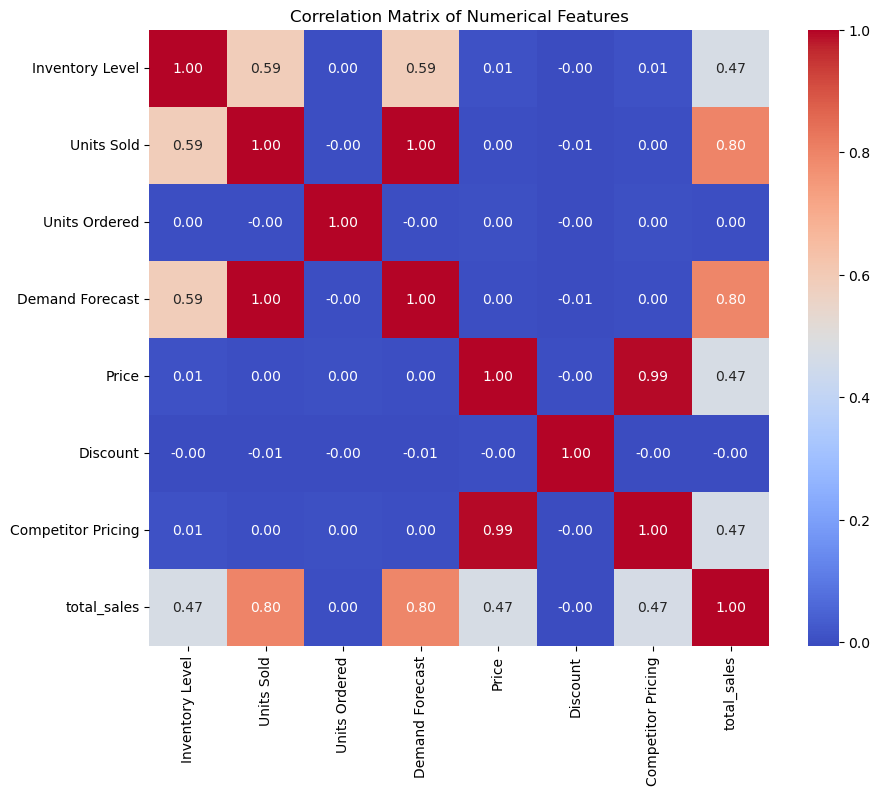

In [165]:
# Correlation Matrix and Heatmap
numerical_features = ['Inventory Level', 'Units Sold', 'Units Ordered', 'Demand Forecast', 'Price', 'Discount', 'Competitor Pricing', 'total_sales']
correlation_matrix = df[numerical_features].corr()
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Correlation Matrix of Numerical Features")
plt.show()

In [166]:
fig = px.pie(df, names='Category', hole=0.5, 
             title='Distribution of Category', template='plotly_dark')
fig.show()

In [167]:
df_counts = df['Weather Condition'].value_counts().reset_index()

fig = px.bar(df_counts, x='Weather Condition', y='count',
             title='Distribution of Weather Condition',
             text_auto=True,
             color_discrete_sequence=['DeepSkyBlue'], template='plotly_dark')
fig.update_layout(xaxis_title='Weather Condition', yaxis_title='Frequency')
fig.show()

In [168]:
fig = px.pie(df, names='Region', 
             title='Distribution of Region', template='plotly_dark')
fig.show()

In [169]:
df_counts = df['Discount'].value_counts().reset_index()

fig = px.bar(df_counts, x='Discount', y='count',
             title='Distribution of Discount',
             text_auto=True,
             color_discrete_sequence=['greenyellow'], template='plotly_dark')
fig.update_layout(xaxis_title='Discount', yaxis_title='Frequency')
fig.show()

In [170]:
fig = px.pie(df, names='Holiday/Promotion', 
             title='Distribution of Holiday/Promotion', template='plotly_dark')
fig.show()

In [171]:
df_counts = df['Seasonality'].value_counts().reset_index()

fig = px.bar(df_counts, x='Seasonality', y='count',
             title='Distribution of Seasonality',
             text_auto=True,
             color_discrete_sequence=['brown'], template='plotly_dark')
fig.update_layout(xaxis_title='Seasonality', yaxis_title='Frequency')
fig.show()

In [172]:
fig = px.histogram(df, x='Inventory Level', nbins=30, 
                   title='Distribution of Inventory Levels',
                   color_discrete_sequence=['navy'], template='plotly_dark')
fig.update_layout(xaxis_title='Inventory Level', yaxis_title='Frequency')
fig.show()

In [173]:
fig = px.histogram(df, x='Units Ordered', nbins=30, 
                   title='Distribution of Units Ordered',
                   color_discrete_sequence=['purple'], template='plotly_dark')
fig.update_layout(xaxis_title='Units Ordered', yaxis_title='Frequency')
fig.show()

In [174]:
fig = px.histogram(df, x='Units Sold', nbins=30, 
                   title='Distribution of Units Sold',
                   color_discrete_sequence=['red'], template='plotly_dark')
fig.update_layout(xaxis_title='Units Sold', yaxis_title='Frequency')
fig.show()

In [175]:
fig = px.histogram(df, x='Demand Forecast', nbins=30, 
                   title='Distribution of Demand Forecast',
                   color_discrete_sequence=['orange'], template='plotly_dark')
fig.update_layout(xaxis_title='Demand Forecast', yaxis_title='Frequency')
fig.show()

In [176]:
fig = px.histogram(df, x='Price', nbins=30, 
                   title='Distribution of Price',
                   color_discrete_sequence=['magenta'], template='plotly_dark')
fig.update_layout(xaxis_title='Price', yaxis_title='Frequency')
fig.show()

In [177]:
fig = px.histogram(df, x='Competitor Pricing', nbins=30, 
                   title='Distribution of Competitor Pricing',
                   color_discrete_sequence=['olive'], template='plotly_dark')
fig.update_layout(xaxis_title='Price', yaxis_title='Frequency')
fig.show()

In [178]:
df_grouped = df.groupby('Category', as_index=False)['total_sales'].sum()

fig = px.bar(df_grouped, x='Category', y='total_sales', 
             title='Total Sales by Category', 
             color='Category', 
             text_auto=True, template='plotly_dark')  

fig.update_layout(xaxis_title='Category', yaxis_title='Total Sales')

fig.show()

In [179]:
df_grouped = df.groupby('Weather Condition', as_index=False)['total_sales'].sum()

fig = px.bar(df_grouped, x='Weather Condition', y='total_sales', 
             title='Total Sales by Weather Condition', 
             color='Weather Condition', 
             text_auto=True, template='plotly_dark')  

fig.update_layout(xaxis_title='Weather Condition', yaxis_title='Total Sales')

fig.show()

In [180]:
df_grouped = df.groupby('Seasonality', as_index=False)['total_sales'].sum()

fig = px.bar(df_grouped, x='Seasonality', y='total_sales', 
             title='Total Sales by Seasonality', 
             color='Seasonality', 
             text_auto=True, template='plotly_dark')  

fig.update_layout(xaxis_title='Seasonality', yaxis_title='Total Sales')

fig.show()

In [181]:
df_grouped = df.groupby('Region', as_index=False)['total_sales'].sum()

fig = px.bar(df_grouped, x='Region', y='total_sales', 
             title='Total Sales by Region', 
             color='Region', 
             text_auto=True, template='plotly_dark')  

fig.update_layout(xaxis_title='Region', yaxis_title='Total Sales')

fig.show()

In [182]:
df_grouped = df.groupby('Discount', as_index=False)['total_sales'].sum()

fig = px.bar(df_grouped, x='Discount', y='total_sales', 
             title='Total Sales by Discount', 
             color='Discount', 
             text_auto=True, template='plotly_dark')  

fig.update_layout(xaxis_title='Discount', yaxis_title='Total Sales')

fig.show()

In [183]:
df_grouped = df.groupby('Holiday/Promotion', as_index=False)['total_sales'].sum()

fig = px.bar(df_grouped, x='Holiday/Promotion', y='total_sales', 
             title='Total Sales by Holiday/Promotion', 
             color='Holiday/Promotion', 
             text_auto=True, template='plotly_dark')  

fig.update_layout(xaxis_title='Holiday/Promotion', yaxis_title='Total Sales')

fig.show()

In [184]:
# Get the top 6 highest priced products without duplicate Product IDs
top_6_highest = df.sort_values(by='Price', ascending=False).drop_duplicates(subset='Product ID').head(6)

# Get the top 6 lowest priced products without duplicate Product IDs
top_6_lowest = df.sort_values(by='Price', ascending=True).drop_duplicates(subset='Product ID').head(6)

# Create the Plotly figure
fig = go.Figure()

# Add bars for the highest priced products
fig.add_trace(go.Bar(
    x=top_6_highest['Product ID'],
    y=top_6_highest['Price'],
    name='Top 6 Highest Priced',
    marker=dict(color='royalblue'),
    text=top_6_highest['Price'],  # Display price values on hover
    textposition='outside',
))

# Add bars for the lowest priced products
fig.add_trace(go.Bar(
    x=top_6_lowest['Product ID'],
    y=top_6_lowest['Price'],
    name='Top 6 Lowest Priced',
    marker=dict(color='tomato'),
    text=top_6_lowest['Price'],  # Display price values on hover
    textposition='outside',
))

# Update the layout for better readability
fig.update_layout(
    title='Top 6 Highest and Lowest Priced Products',
    xaxis_title='Product ID',
    yaxis_title='Price',
    barmode='group',  # Group the bars for comparison
    template='plotly_dark',  # Optional: Change the template
    height=500,
    showlegend=True  # Show legend for categories
)

# Show the plot
fig.show()

In [185]:
# Group by Store ID and calculate the total price for each store
top_stores = df.groupby('Store ID').agg({'total_sales': 'sum'}).reset_index()

# Sort the stores by total price in descending order and get the top 3
top_3_stores = top_stores.sort_values(by='total_sales', ascending=False).head(3)

# Create the Plotly figure
fig = go.Figure()

# Add bars for the top 3 stores by total price
fig.add_trace(go.Bar(
    x=top_3_stores['Store ID'],
    y=top_3_stores['total_sales'],
    marker=dict(color='green'),
    text=top_3_stores['total_sales'],  # Display total price on hover
    textposition='outside',
))

# Update the layout for better readability
fig.update_layout(
    title='Top 3 Stores by Total Sales',
    xaxis_title='Store ID',
    yaxis_title='Total Sales',
    template='plotly_dark',  # Optional: Change the template
    height=500,
    showlegend=False  # No legend needed in this case
)

# Show the plot
fig.show()

In [186]:
df_grouped = df.groupby('Date', as_index=False)['total_sales'].sum()

fig = px.line(df_grouped, x='Date', y='total_sales', 
              title='Total Sales Over Time', 
              markers=True, template='plotly_dark')  # Adds data points

fig.update_layout(xaxis_title='Date', yaxis_title='Total Sales')
fig.show()

In [187]:
df['Date'] = pd.to_datetime(df['Date'])

# Select necessary columns
df_monthly = df[['Date', 'Store ID', 'total_sales']]

# Group by month-end ('ME') and store, then sum the prices
df_monthly_store = df_monthly.groupby([pd.Grouper(key='Date', freq='M'), 'Store ID']).agg({'total_sales': 'sum'}).reset_index()


# Pivot the data to have 'Date' as the index and 'Store ID' as columns
df_monthly_store_pivot = df_monthly_store.pivot_table(index='Date', columns='Store ID', values='total_sales').reset_index()

# Plotting the data
fig = px.line(df_monthly_store_pivot, x='Date', y=df_monthly_store_pivot.columns[1:], 
              title='Monthly Total Sales by Store Over Time', markers=True, template='plotly_dark')

fig.update_layout(xaxis_title='Month', yaxis_title='Total Sales')
fig.show()

In [188]:
df_monthly = df.resample('M', on='Date')['total_sales'].sum().reset_index()

fig = px.line(df_monthly, x='Date', y='total_sales', 
              title='Monthly Total Sales Over 2 Years',
              markers=True, template='plotly_dark')

fig.update_layout(xaxis_title='Month', yaxis_title='Total Sales')
fig.show()

In [189]:
df_quarterly = df.resample('Q', on='Date')['total_sales'].sum().reset_index()

fig = px.line(df_quarterly, x='Date', y='total_sales', 
              title='Quarterly Total Sales Over 2 Years',
              markers=True, template='plotly_dark')

fig.update_layout(xaxis_title='Quarter', yaxis_title='Total Sales')
fig.show()

In [190]:
df_yearly = df.resample('Y', on='Date')['total_sales'].sum().reset_index()

fig = px.line(df_yearly, x='Date', y='total_sales', 
              title='Yearly Total Sales Over 2 Years',
              markers=True, template='plotly_dark')

fig.update_layout(xaxis_title='Year', yaxis_title='Total Sales')
fig.show()

In [191]:
# Select necessary columns and resample by month
df_monthly = df[['Date', 'Category', 'total_sales']]

# Now, create a pivot table for monthly sales by category
df_monthly_category = df_monthly.groupby([pd.Grouper(key='Date', freq='M'), 'Category']).agg({'total_sales': 'sum'}).reset_index()

# Pivot the data to have 'Date' as the index and 'Category' as columns
df_monthly_category_pivot = df_monthly_category.pivot_table(index='Date', columns='Category', values='total_sales').reset_index()

# Plotting the data
fig = px.line(df_monthly_category_pivot, x='Date', y=df_monthly_category_pivot.columns[1:], 
              title='Monthly Total Sales by Category Over 2 Years', markers=True, template='plotly_dark')

fig.update_layout(xaxis_title='Month', yaxis_title='Total Sales')
fig.show()


In [192]:
# Select necessary columns and resample by month
df_monthly = df[['Date', 'Region', 'total_sales']]

# Now, create a pivot table for monthly sales by category
df_monthly_category = df_monthly.groupby([pd.Grouper(key='Date', freq='M'), 'Region']).agg({'total_sales': 'sum'}).reset_index()

# Pivot the data to have 'Date' as the index and 'Category' as columns
df_monthly_category_pivot = df_monthly_category.pivot_table(index='Date', columns='Region', values='total_sales').reset_index()

# Plotting the data
fig = px.line(df_monthly_category_pivot, x='Date', y=df_monthly_category_pivot.columns[1:], 
              title='Monthly Total Sales by Region Over 2 Years', markers=True, template='plotly_dark')

fig.update_layout(xaxis_title='Month', yaxis_title='Total Sales')
fig.show()

In [193]:
# Select necessary columns and resample by month
df_monthly = df[['Date', 'Seasonality', 'total_sales']]

# Now, create a pivot table for monthly sales by category
df_monthly_category = df_monthly.groupby([pd.Grouper(key='Date', freq='M'), 'Seasonality']).agg({'total_sales': 'sum'}).reset_index()

# Pivot the data to have 'Date' as the index and 'Category' as columns
df_monthly_category_pivot = df_monthly_category.pivot_table(index='Date', columns='Seasonality', values='total_sales').reset_index()

# Plotting the data
fig = px.line(df_monthly_category_pivot, x='Date', y=df_monthly_category_pivot.columns[1:], 
              title='Monthly Total Sales by Seasonality Over 2 Years', markers=True, template='plotly_dark')

fig.update_layout(xaxis_title='Month', yaxis_title='Total Sales')
fig.show()

In [194]:
# Select necessary columns and resample by month
df_monthly = df[['Date', 'Discount', 'total_sales']]

# Now, create a pivot table for monthly sales by category
df_monthly_category = df_monthly.groupby([pd.Grouper(key='Date', freq='M'), 'Discount']).agg({'total_sales': 'sum'}).reset_index()

# Pivot the data to have 'Date' as the index and 'Category' as columns
df_monthly_category_pivot = df_monthly_category.pivot_table(index='Date', columns='Discount', values='total_sales').reset_index()

# Plotting the data
fig = px.line(df_monthly_category_pivot, x='Date', y=df_monthly_category_pivot.columns[1:], 
              title='Monthly Total Sales by Discount Over 2 Years', markers=True, template='plotly_dark')

fig.update_layout(xaxis_title='Month', yaxis_title='Total Sales')
fig.show()

In [195]:
# Select necessary columns and resample by month
df_monthly = df[['Date', 'Inventory Level', 'Price']]

# Group by month-end ('ME') and aggregate (sum for simplicity)
df_monthly_aggregated = df_monthly.groupby([pd.Grouper(key='Date', freq='M')]).agg({
    'Inventory Level': 'sum',  # You can use 'mean' if needed
    'Price': 'sum'  # You can use 'sum' if you need total price over time
}).reset_index()

# Create a line plot with dual axes
fig = px.line(df_monthly_aggregated, x='Date', y='Inventory Level', 
              title='Inventory Level and Price Over Months', markers=True, template='plotly_dark')

# Add a secondary y-axis for Price
fig.update_layout(
    yaxis_title='Inventory Level',
    xaxis_title='Date',
    yaxis2=dict(
        title='Price',
        overlaying='y',
        side='right'
    ),
    showlegend=False  # Optional: hide legend if not needed
)

# Add Price as a line on the secondary y-axis
fig.add_scatter(
    x=df_monthly_aggregated['Date'], 
    y=df_monthly_aggregated['Price'], 
    mode='lines+markers', 
    name='Price', 
    line=dict(color='orange'),
    yaxis='y2'  # Use the secondary y-axis for price
)

# Show the plot
fig.show()

In [196]:
# Select necessary columns and resample by month
df_monthly = df[['Date', 'Units Sold', 'Price']]

# Group by month-end ('ME') and aggregate (sum for simplicity)
df_monthly_aggregated = df_monthly.groupby([pd.Grouper(key='Date', freq='M')]).agg({
    'Units Sold': 'sum',  # Aggregating units sold (you can also use mean if needed)
    'Price': 'sum'  # Aggregating price over time
}).reset_index()

# Create a line plot with dual axes
fig = px.line(df_monthly_aggregated, x='Date', y='Units Sold', 
              title='Units Sold and Price Over Months', markers=True, template='plotly_dark')

# Add a secondary y-axis for Price
fig.update_layout(
    yaxis_title='Units Sold',
    xaxis_title='Date',
    yaxis2=dict(
        title='Total Price',
        overlaying='y',
        side='right'
    ),
    showlegend=False  # Optional: hide legend if not needed
)

# Add Price as a line on the secondary y-axis
fig.add_scatter(
    x=df_monthly_aggregated['Date'], 
    y=df_monthly_aggregated['Price'], 
    mode='lines+markers', 
    name='Total Price', 
    line=dict(color='orange'),
    yaxis='y2'  # Use the secondary y-axis for price
)

# Show the plot
fig.show()

In [197]:
# Select necessary columns and resample by month
df_monthly = df[['Date', 'Price', 'Competitor Pricing']]

# Group by month-end ('ME') and aggregate (sum for simplicity)
df_monthly_aggregated = df_monthly.groupby([pd.Grouper(key='Date', freq='M')]).agg({
    'Price': 'sum',
    'Competitor Pricing': 'sum'
}).reset_index()

# Create a line plot
fig = px.line(
    df_monthly_aggregated,
    x='Date',
    y=['Price', 'Competitor Pricing'],
    title='Price vs Competitor Pricing Over Months',
    labels={'value': 'Price', 'variable': 'Type'},
    template='plotly_dark'
)

# Update layout and show plot
fig.update_layout(
    xaxis_title='Date',
    yaxis_title='Price',
    legend_title='Type'
)

fig.show()

In [198]:
# Select necessary columns and resample by month
df_monthly = df[['Date', 'Units Sold', 'Demand Forecast']]

# Group by month-end ('ME') and aggregate (sum for simplicity)
df_monthly_aggregated = df_monthly.groupby([pd.Grouper(key='Date', freq='M')]).agg({
    'Units Sold': 'sum',
    'Demand Forecast': 'sum'
}).reset_index()

# Create a line plot
fig = px.line(
    df_monthly_aggregated,
    x='Date',
    y=['Units Sold', 'Demand Forecast'],
    title='Units Sold & Demand Forecast Over Months',
    labels={'value': 'Value', 'variable': 'Metric'},
    template='plotly_dark'
)

# Update layout and show plot
fig.update_layout(
    xaxis_title='Date',
    yaxis_title='Value',
    legend_title='Metric'
)

fig.show()

In [199]:
# Filter the DataFrame for Product IDs that end with 'f'
df_filtered = df[df['Product ID'].str.endswith('F')]

# Select necessary columns and resample by month
df_monthly = df_filtered[['Date', 'Product ID', 'total_sales']]

# Group by month-end ('ME') and Product ID, then calculate the average price for each product
df_monthly_avg_price = df_monthly.groupby([pd.Grouper(key='Date', freq='M'), 'Product ID']).agg({
    'total_sales': 'mean'
}).reset_index()

# Create a line plot for the average price of each product over time
fig = px.line(df_monthly_avg_price, x='Date', y='total_sales', color='Product ID', 
              title='Average Sales of Furniture Products Over Months', markers=True, template='plotly_dark')

# Update layout and show plot
fig.update_layout(
    xaxis_title='Date',
    yaxis_title='Average Sales',
    showlegend=True  # Show legend to differentiate products
)

fig.show()

In [200]:
# Filter the DataFrame for Product IDs that end with 'f'
df_filtered = df[df['Product ID'].str.endswith('E')]

# Select necessary columns and resample by month
df_monthly = df_filtered[['Date', 'Product ID', 'total_sales']]

# Group by month-end ('ME') and Product ID, then calculate the average price for each product
df_monthly_avg_price = df_monthly.groupby([pd.Grouper(key='Date', freq='M'), 'Product ID']).agg({
    'total_sales': 'mean'
}).reset_index()

# Create a line plot for the average price of each product over time
fig = px.line(df_monthly_avg_price, x='Date', y='total_sales', color='Product ID', 
              title='Average Sales of Electronics Products Over Months', markers=True, template='plotly_dark')

# Update layout and show plot
fig.update_layout(
    xaxis_title='Date',
    yaxis_title='Average Sales',
    showlegend=True  # Show legend to differentiate products
)

fig.show()

In [201]:
# Filter the DataFrame for Product IDs that end with 'f'
df_filtered = df[df['Product ID'].str.endswith('C')]

# Select necessary columns and resample by month
df_monthly = df_filtered[['Date', 'Product ID', 'total_sales']]

# Group by month-end ('ME') and Product ID, then calculate the average price for each product
df_monthly_avg_price = df_monthly.groupby([pd.Grouper(key='Date', freq='M'), 'Product ID']).agg({
    'total_sales': 'mean'
}).reset_index()

# Create a line plot for the average price of each product over time
fig = px.line(df_monthly_avg_price, x='Date', y='total_sales', color='Product ID', 
              title='Average Sales of clothing Products Over Months', markers=True, template='plotly_dark')

# Update layout and show plot
fig.update_layout(
    xaxis_title='Date',
    yaxis_title='Average Sales',
    showlegend=True  # Show legend to differentiate products
)

fig.show()

In [202]:
# Filter the DataFrame for Product IDs that end with 'f'
df_filtered = df[df['Product ID'].str.endswith('G')]

# Select necessary columns and resample by month
df_monthly = df_filtered[['Date', 'Product ID', 'total_sales']]

# Group by month-end ('ME') and Product ID, then calculate the average price for each product
df_monthly_avg_price = df_monthly.groupby([pd.Grouper(key='Date', freq='M'), 'Product ID']).agg({
    'total_sales': 'mean'
}).reset_index()

# Create a line plot for the average price of each product over time
fig = px.line(df_monthly_avg_price, x='Date', y='total_sales', color='Product ID', 
              title='Average Sales of Groceries Products Over Months', markers=True, template='plotly_dark')

# Update layout and show plot
fig.update_layout(
    xaxis_title='Date',
    yaxis_title='Average Sales',
    showlegend=True  # Show legend to differentiate products
)

fig.show()

In [203]:
# Filter the DataFrame for Product IDs that end with 'f'
df_filtered = df[df['Product ID'].str.endswith('T')]

# Select necessary columns and resample by month
df_monthly = df_filtered[['Date', 'Product ID', 'total_sales']]

# Group by month-end ('ME') and Product ID, then calculate the average price for each product
df_monthly_avg_price = df_monthly.groupby([pd.Grouper(key='Date', freq='M'), 'Product ID']).agg({
    'total_sales': 'mean'
}).reset_index()

# Create a line plot for the average price of each product over time
fig = px.line(df_monthly_avg_price, x='Date', y='total_sales', color='Product ID', 
              title='Average Sales of Toys Products Over Months', markers=True, template='plotly_dark')

# Update layout and show plot
fig.update_layout(
    xaxis_title='Date',
    yaxis_title='Average Sales',
    showlegend=True  # Show legend to differentiate products
)

fig.show()

# Feature Engineering

In [204]:
# Add 'Month' and 'Day of the Week' features
df['Year'] = df['Date'].dt.year
df['Month'] = df['Date'].dt.month
df['Day_of_Week'] = df['Date'].dt.day_name()  # You can use .dt.weekday for numerical representation

# Display the DataFrame with new features
df.head()

,Date,Store ID,Product ID,Category,Region,Inventory Level,Units Sold,Units Ordered,Demand Forecast,Price,Discount,Weather Condition,Holiday/Promotion,Competitor Pricing,Seasonality,total_sales,Year,Month,Day_of_Week
0,2022-01-01,Store A,P5T,Toys,East,231,127,55,135.47,33.50,15,Sunny,1,29.69,Spring,4254.50,2022,1,Saturday
1,2022-01-01,Store A,P1E,Electronics,South,204,150,66,144.04,63.01,0,Cloudy,0,66.16,Spring,9451.50,2022,1,Saturday
2,2022-01-01,Store A,P3E,Electronics,South,102,65,51,74.02,27.99,0,Snowy,0,31.32,Spring,1819.35,2022,1,Saturday
3,2022-01-01,Store C,P2E,Electronics,North,469,61,164,62.18,32.72,0,Snowy,0,34.74,Spring,1995.92,2022,1,Saturday
4,2022-01-01,Store A,P2E,Electronics,East,166,14,135,9.26,73.64,5,Sunny,0,68.95,Summer,1030.96,2022,1,Saturday


# Data Preprossing

In [205]:
df[df['Demand Forecast'] < 0]

,Date,Store ID,Product ID,Category,Region,Inventory Level,Units Sold,Units Ordered,Demand Forecast,Price,Discount,Weather Condition,Holiday/Promotion,Competitor Pricing,Seasonality,total_sales,Year,Month,Day_of_Week
63,2022-01-01,Store A,P2E,Electronics,South,437,0,160,-2.40,87.23,0,Rainy,0,90.36,Spring,0.00,2022,1,Saturday
141,2022-01-02,Store B,P3E,Electronics,East,175,2,140,-3.40,87.50,5,Rainy,0,91.20,Spring,175.00,2022,1,Sunday
278,2022-01-03,Store A,P1E,Electronics,South,140,1,47,-3.91,80.41,0,Rainy,0,76.90,Spring,80.41,2022,1,Monday
511,2022-01-06,Store A,P3E,Electronics,East,59,1,88,-8.37,63.21,0,Cloudy,0,60.48,Autumn,63.21,2022,1,Thursday
730,2022-01-08,Store B,P2E,Electronics,East,64,7,79,-2.99,92.43,0,Sunny,0,88.55,Spring,647.01,2022,1,Saturday
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
72716,2023-12-29,Store B,P1E,Electronics,East,487,7,132,-0.73,55.34,15,Rainy,0,58.03,Spring,387.38,2023,12,Friday
72722,2023-12-29,Store A,P4C,Clothing,East,199,4,180,-5.50,82.08,20,Sunny,0,77.99,Autumn,328.32,2023,12,Friday
72859,2023-12-30,Store A,P1E,Electronics,South,203,1,119,-7.68,94.33,10,Rainy,0,96.79,Spring,94.33,2023,12,Saturday
73026,2024-01-01,Store A,P2E,Electronics,East,53,2,40,-6.08,63.66,0,Sunny,1,62.37,Spring,127.32,2024,1,Monday


In [206]:
# Assuming df is your DataFrame and 'Demand Forecast' is the name of the column
df['Demand Forecast'] = df['Demand Forecast'].apply(lambda x: max(x, 0))

In [207]:
# One-Hot Encoding
df = pd.get_dummies(df, columns=['Store ID', 'Category', 'Region', 'Weather Condition','Seasonality'])

bool_cols = df.select_dtypes(include='bool').columns
df[bool_cols] = df[bool_cols].astype(int)


le = LabelEncoder()

df['Product ID'] = le.fit_transform(df['Product ID'])
df['Day_of_Week'] = le.fit_transform(df['Day_of_Week'])

df = df.drop(columns=['Units Sold','Competitor Pricing', 'Date'])

df

,Product ID,Inventory Level,Units Ordered,Demand Forecast,Price,Discount,Holiday/Promotion,total_sales,Year,Month,...,Region_South,Region_West,Weather Condition_Cloudy,Weather Condition_Rainy,Weather Condition_Snowy,Weather Condition_Sunny,Seasonality_Autumn,Seasonality_Spring,Seasonality_Summer,Seasonality_Winter
0,24,231,55,135.47,33.50,15,1,4254.50,2022,1,...,0,0,0,0,0,1,0,1,0,0
1,1,204,66,144.04,63.01,0,0,9451.50,2022,1,...,1,0,1,0,0,0,0,1,0,0
2,11,102,51,74.02,27.99,0,0,1819.35,2022,1,...,1,0,0,0,1,0,0,1,0,0
3,6,469,164,62.18,32.72,0,0,1995.92,2022,1,...,0,0,0,0,1,0,0,1,0,0
4,6,166,135,9.26,73.64,5,0,1030.96,2022,1,...,0,0,0,0,0,1,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
73095,1,96,127,18.46,73.73,0,0,589.84,2024,1,...,0,0,0,0,0,1,1,0,0,0
73096,1,313,101,48.43,82.57,0,0,4211.07,2024,1,...,0,0,0,0,1,0,1,0,0,0
73097,6,278,151,39.65,11.11,5,0,399.96,2024,1,...,0,0,0,1,0,0,0,1,0,0
73098,2,374,21,270.52,53.14,0,0,14028.96,2024,1,...,0,0,0,1,0,0,1,0,0,0


In [208]:
def remove_outliers(df, columns):
    for col in columns:
        Q1 = df[col].quantile(0.25)
        Q3 = df[col].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR

        df = df[(df[col] >= lower_bound) & (df[col] <= upper_bound)]

    return df

columns_to_check = ['Demand Forecast', 'total_sales']
df = remove_outliers(df, columns_to_check)

# Modeling

In [209]:
X=df.drop('Demand Forecast',axis=1)
y=df['Demand Forecast']

In [210]:
X_train,X_test,y_train,y_test=train_test_split(X, y, test_size=0.2, random_state=42)

In [211]:
cat_model = CatBoostRegressor(verbose=0)
cat_model.fit(X_train, y_train)

importances = cat_model.get_feature_importance()
features = X_train.columns
top7 = sorted(zip(features, importances), key=lambda x: x[1], reverse=True)[:7]

for f, imp in top7:
    print(f"{f}: {imp:.4f}")

top7_features = [f for f, _ in top7]

X_train_top7 = X_train[top7_features]
X_test_top7 = X_test[top7_features]

total_sales: 64.6028
Price: 34.3594
Inventory Level: 0.8752
Units Ordered: 0.0369
Month: 0.0222
Product ID: 0.0191
Day_of_Week: 0.0118


In [212]:
scaler=StandardScaler()

X_train=scaler.fit_transform(X_train_top7)
X_test=scaler.transform(X_test_top7)

In [213]:
# Define and fit models individually

# Linear Regression
linear_model = LinearRegression()
linear_model.fit(X_train, y_train)

# Decision Tree
decision_tree_model = DecisionTreeRegressor(random_state=42)
decision_tree_model.fit(X_train, y_train)

# Random Forest
random_forest_model = RandomForestRegressor(random_state=42, n_jobs=-1)
random_forest_model.fit(X_train, y_train)

# Gradient Boosting
gb_model = GradientBoostingRegressor(random_state=42)
gb_model.fit(X_train, y_train)

# AdaBoost
ada_model = AdaBoostRegressor(random_state=42)
ada_model.fit(X_train, y_train)

# XGBoost
xgb_model = XGBRegressor(random_state=42, verbosity=0)
xgb_model.fit(X_train, y_train)

# LightGBM
lgb_model = LGBMRegressor(random_state=42)
lgb_model.fit(X_train, y_train)

# CatBoost
catboost_model = CatBoostRegressor(random_state=42, verbose=0)
catboost_model.fit(X_train, y_train)

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000283 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 992
[LightGBM] [Info] Number of data points in the train set: 55022, number of used features: 7
[LightGBM] [Info] Start training from score 127.731736


# Model Evaluation

In [214]:
# Define regression models
regressors = {
    "Linear Regression": LinearRegression(),
    "Decision Tree": DecisionTreeRegressor(random_state=42),
    "Random Forest": RandomForestRegressor(random_state=42, n_jobs=-1),
    "Gradient Boosting": GradientBoostingRegressor(random_state=42),
    "AdaBoost": AdaBoostRegressor(random_state=42),
    "XGBoost": XGBRegressor(random_state=42, verbosity=0),
    "LightGBM": LGBMRegressor(random_state=42),
    "CatBoost": CatBoostRegressor(random_state=42, verbose=0)
}

# Store results
results = []
predictions = {}

# Evaluate each regressor
for name, model in regressors.items():
    model.fit(X_train, y_train)
    
    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)

    predictions[name] = y_test_pred

    r2_train = r2_score(y_train, y_train_pred)
    r2_test = r2_score(y_test, y_test_pred)
    mse = mean_squared_error(y_test, y_test_pred)
    mae = mean_absolute_error(y_test, y_test_pred)

    results.append({
        'Model': name,
        'R2_Train': r2_train,
        'R2_Test': r2_test,
        'MSE': mse,
        'MAE': mae
    })

# Convert to DataFrame
results_df = pd.DataFrame(results)

# Format numbers to 4 decimal places
results_df['R2_Train'] = results_df['R2_Train'].apply(lambda x: f"{x:.4f}")
results_df['R2_Test'] = results_df['R2_Test'].apply(lambda x: f"{x:.4f}")
results_df['MSE'] = results_df['MSE'].apply(lambda x: f"{x:.4f}")
results_df['MAE'] = results_df['MAE'].apply(lambda x: f"{x:.4f}")

# Sort by R2_Test descending
results_df = results_df.sort_values(by="R2_Test", ascending=False)

# Display final results
print("\nFinal Results:")
print(results_df.to_string(index=False))

# Detailed evaluation for best model
best_model_name = results_df.iloc[0]['Model']
y_pred = predictions[best_model_name]

print(f"\nDetailed Evaluation for Best Model ({best_model_name}):")
print(f"R2 Score: {r2_score(y_test, y_pred):.4f}")
print(f"Mean Squared Error: {mean_squared_error(y_test, y_pred):.4f}")
print(f"Mean Absolute Error: {mean_absolute_error(y_test, y_pred):.4f}")

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000605 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 992
[LightGBM] [Info] Number of data points in the train set: 55022, number of used features: 7
[LightGBM] [Info] Start training from score 127.731736

Final Results:
            Model R2_Train R2_Test       MSE     MAE
         CatBoost   0.9922  0.9915   78.1116  7.5781
         LightGBM   0.9916  0.9911   81.7139  7.7000
    Random Forest   0.9987  0.9910   83.3773  7.7660
          XGBoost   0.9925  0.9905   87.5388  7.8815
Gradient Boosting   0.9876  0.9874  116.1416  8.7186
    Decision Tree   1.0000  0.9823  163.6928 10.3529
         AdaBoost   0.8761  0.8777 1128.5343 28.2576
Linear Regression   0.8124  0.8127 1728.6925 30.5160

Detailed Evaluation for Best Model (CatBoost):
R2 Score: 0.9915
Mean Squared Error: 78.1116
Mean Abs

In [215]:
# Convert results to DataFrame and sort by R² Test descending
df_results = pd.DataFrame(results)
df_results = df_results.sort_values(by='R2_Test', ascending=False).reset_index(drop=True)

# Get number of models
n = len(df_results)

# Use default Viridis color scale
viridis_colors = px.colors.sequential.Viridis

# If more colors are needed, sample from the Viridis colorscale
if n > len(viridis_colors):
    viridis_colors = px.colors.sample_colorscale('Viridis', [i/(n-1) for i in range(n)])

# Assign colors for Train and Test bars
train_colors = viridis_colors
test_colors = [f'rgba({int(c[1:3],16)},{int(c[3:5],16)},{int(c[5:7],16)},0.6)' for c in viridis_colors]

# Create the figure
fig = go.Figure()

# Add R² Train bars
fig.add_trace(
    go.Bar(
        x=df_results['Model'],
        y=df_results['R2_Train'],
        name='R² Train',
        marker_color=train_colors,
        text=df_results['R2_Train'].round(3),
        textposition='auto'
    )
)

# Add R² Test bars
fig.add_trace(
    go.Bar(
        x=df_results['Model'],
        y=df_results['R2_Test'],
        name='R² Test',
        marker_color=test_colors,
        text=df_results['R2_Test'].round(3),
        textposition='auto'
    )
)

# Customize the layout and styling
fig.update_layout(
    title='📊 R² Score Comparison for Train and Test Sets (Viridis Color Scale)',
    xaxis_title='Regression Models',
    yaxis_title='R² Score',
    barmode='group',
    xaxis_tickangle=-30,
    template='plotly_dark',
    font=dict(size=13),
    legend=dict(x=0.75, y=1.15, orientation='h'),
    margin=dict(l=40, r=40, t=80, b=40)
)

# Show the interactive bar chart
fig.show()

# Save the Model

In [216]:
import joblib

# Save each model
for name, model in regressors.items():
    joblib.dump(model, f'{name.lower().replace(" ", "_")}_model.pkl')

print("All models saved successfully.")

All models saved successfully.


In [217]:
%%writefile main.py
import streamlit as st
import pandas as pd
import numpy as np
import joblib

# Load models
LightGBM_model = joblib.load('LightGBM_model.pkl')
CatBoost_model = joblib.load('CatBoost_model.pkl')

# Page configuration
st.set_page_config(page_title="Retail Demand Forecasting | DEPI Project", page_icon="📈")

# App header
st.title("📦 Retail Demand Forecasting App")
st.markdown("#### Powered by **DEPI Final Project 2025** 🚀")
st.markdown("Enter the product and sales details below to predict demand using trained regression models.")

# Input features
st.subheader("📝 Input Features (Top 7)")

product_id = st.number_input("Product ID", min_value=0)
inventory_level = st.number_input("Inventory Level", min_value=0)
units_ordered = st.number_input("Units Ordered", min_value=0)
total_sales = st.number_input("Total Sales", min_value=0.0)
price = st.number_input("Price", min_value=0.0)
month = st.selectbox("Month", list(range(1, 13)))
day_of_week = st.selectbox("Day of Week", 
    ["Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday"]
)

# Simple label encoding for Day_of_Week
day_mapping = {
    "Monday": 0, "Tuesday": 1, "Wednesday": 2, "Thursday": 3,
    "Friday": 4, "Saturday": 5, "Sunday": 6
}
day_encoded = day_mapping[day_of_week]

# Predict button
if st.button("🔍 Predict Demand"):
    features = np.array([[total_sales, price, inventory_level, units_ordered, month, product_id, day_encoded]])

    LightGBM_pred = LightGBM_model.predict(features)[0]
    CatBoost_pred = CatBoost_model.predict(features)[0]

    st.success(f"📊 LightGBM Prediction: **{LightGBM_pred:.2f} Units**")
    st.success(f"🌳 CatBoost Prediction: **{CatBoost_pred:.2f} Units**")

    st.balloons()

# Footer
st.markdown("""---  
Made with ❤️ as part of **DEPI Final Project | 2025**
""")

Overwriting main.py


In [ ]:
!streamlit run main.py

# MLflow

In [ ]:
import mlflow
import mlflow.sklearn
import mlflow.xgboost
import mlflow.lightgbm

mlflow.set_tracking_uri("file:///C:/mlflow_logs")
mlflow.set_experiment("Retail Demand Forecasting")

In [ ]:
# Evaluate each regressor with MLflow tracking (no scaling for any model)
for name, model in regressors.items():
    with mlflow.start_run(run_name=name):
        # Fit and predict using unscaled data for all models
        model.fit(X_train, y_train)
        y_train_pred = model.predict(X_train)
        y_test_pred = model.predict(X_test)

        # Metrics for training data
        r2_train = r2_score(y_train, y_train_pred)
        mse_train = mean_squared_error(y_train, y_train_pred)
        mae_train = mean_absolute_error(y_train, y_train_pred)

        # Metrics for test data
        r2_test = r2_score(y_test, y_test_pred)
        mse_test = mean_squared_error(y_test, y_test_pred)
        mae_test = mean_absolute_error(y_test, y_test_pred)

        # Log metrics to MLflow
        mlflow.log_metric("R2_Train", r2_train)
        mlflow.log_metric("MSE_Train", mse_train)
        mlflow.log_metric("MAE_Train", mae_train)

        mlflow.log_metric("R2_Test", r2_test)
        mlflow.log_metric("MSE_Test", mse_test)
        mlflow.log_metric("MAE_Test", mae_test)

        # Log model to MLflow
        if name == "XGBoost":
            mlflow.xgboost.log_model(model, artifact_path="model")
        elif name == "LightGBM":
            mlflow.lightgbm.log_model(model, artifact_path="model")
        elif name == "CatBoost":
            mlflow.catboost.log_model(model, artifact_path="model")
        else:
            mlflow.sklearn.log_model(model, artifact_path="model")

        print(f"{name} model logged to MLflow.")

print("✅ All models trained and logged.")

In [ ]:
!mlflow ui